# California Housing Data Regression

#### Utilize numerous regression techniques, with Median House Value as the target variable and evaluate the performance of each as well as results.

#### Note techniques used include:
1. Linear Regression
2. RidgeCV
3. Lasso
4. Random Forest
5. XGBoost

## Import Libraries

In [1]:
from sklearn.datasets import fetch_california_housing # Brings in Dataset

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib
import plotly.express as px
#import geopandas
from pandas_profiling import ProfileReport
from urllib.request import urlopen
import json
import plotly.graph_objects as go
import statsmodels.api as sm
import statsmodels.formula.api as smf
from statsmodels.tools.eval_measures import rmse
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression, RidgeCV, Lasso
import sklearn.metrics as metrics
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor, plot_importance

### Set plotting parameters

In [2]:
matplotlib.rcParams['figure.figsize'] = [12, 8]
sns.set_style('darkgrid')
sns.set(font_scale=1.2)
%matplotlib inline

### Defining Classes/Functions

In [3]:
def regression(method, x_dat, y_dat, regression_type, **params):
    
    #fit model
    mod = method(**params)
    mod.fit(x_dat, y_dat)
    y_pred = mod.predict(x_dat)
    
    regression_results(y_dat, y_pred)
    
    if regression_type == 'Tree':
        print('Feature Importance Plot')
        sns.barplot(y=x_dat.columns, x=mod.feature_importances_)
        plt.xlabel('Mean Decrease Gini')
        plt.show()
    
    if regression_type == 'Linear':
        coef_results(x_dat, mod)
        
    print('Predicted Vs. Actual By Location')
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(24,12))
    sns.scatterplot(x=x_dat.Longitude, y=x_dat.Latitude, hue=y_dat, ax=ax1, palette = 'viridis',\
                    hue_norm = (y_dat.min(), y_dat.max()))
    sns.scatterplot(x=x_dat.Longitude, y=x_dat.Latitude, hue=y_pred, ax=ax2, palette= 'viridis',\
                    hue_norm = (y_dat.min(), y_dat.max()))
    ax1.set_title('Actual Housing values')
    ax2.set_title('Predicted Housing Values')
    plt.show()
    
    print('Predicted Vs. Actual Values')
    plt.figure(figsize=(12,12))
    sns.scatterplot(x=y_dat, y=y_pred)
    plt.xlabel('Actual Values')
    plt.ylabel('Predicted Values')
    plt.show()


In [4]:
def regression_results(y_true, y_pred):
    print(color.UNDERLINE+'EVALUATION METRICS'+color.END)
    # Regression metrics
    mean_absolute_error=metrics.mean_absolute_error(y_true, y_pred) 
    mse=metrics.mean_squared_error(y_true, y_pred) 
    median_absolute_error=metrics.median_absolute_error(y_true, y_pred)
    r2=metrics.r2_score(y_true, y_pred)
 
    print(color.BOLD + 'R2:  ' + color.END, round(r2,5))
    print(color.BOLD + 'MAE: ' + color.END, round(mean_absolute_error,5))
    print(color.BOLD + 'MSE: ' + color.END, round(mse,5))
    print(color.BOLD + 'RMSE:' + color.END, round(np.sqrt(mse),5))

In [5]:
def coef_results(x_train,model):
    print(color.UNDERLINE+'COEFFICIENTS'+color.END)
    print(color.BOLD +"Intercept:" + color.END,
          round(model.intercept_,4))
    for i in range(model.n_features_in_):
        print(color.BOLD + str(x.columns[i])+':'+ color.END,
              round(model.coef_[i],6))

In [6]:
class color:
   PURPLE = '\033[95m'
   CYAN = '\033[96m'
   DARKCYAN = '\033[36m'
   BLUE = '\033[94m'
   GREEN = '\033[92m'
   YELLOW = '\033[93m'
   RED = '\033[91m'
   BOLD = '\033[1m'
   UNDERLINE = '\033[4m'
   END = '\033[0m'

## Load Dataset, Explore and Display Features

In [7]:
housing = fetch_california_housing()
housing_df = pd.DataFrame(data= np.c_[housing['data'], housing['target']],
                     columns= housing['feature_names'] + ['MedHouseVal'])

In [8]:
housing_df.sample(3)

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,MedHouseVal
16679,4.8490,7.0,6.618212,1.204678,2863.0,2.391813,35.15,-120.64,2.750
1587,8.0839,16.0,7.421717,0.959596,1177.0,2.972222,37.83,-121.99,3.720
7675,4.8542,36.0,4.365979,0.953608,713.0,3.675258,33.92,-118.09,1.674


In [9]:
housing_df.describe()

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,MedHouseVal
count,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000
mean,3.870671,28.639486,5.429000,1.096675,1425.476744,3.070655,35.631861,-119.569704,2.068558
std,1.899822,12.585558,2.474173,0.473911,1132.462122,10.386050,2.135952,2.003532,1.153956
min,0.499900,1.000000,0.846154,0.333333,3.000000,0.692308,32.540000,-124.350000,0.149990
25%,2.563400,18.000000,4.440716,1.006079,787.000000,2.429741,33.930000,-121.800000,1.196000
50%,3.534800,29.000000,5.229129,1.048780,1166.000000,2.818116,34.260000,-118.490000,1.797000
75%,4.743250,37.000000,6.052381,1.099526,1725.000000,3.282261,37.710000,-118.010000,2.647250
max,15.000100,52.000000,141.909091,34.066667,35682.000000,1243.333333,41.950000,-114.310000,5.000010


In [10]:
profile = ProfileReport(housing_df)
profile

Summarize dataset:   0%|          | 0/22 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Pairplot of predictive attributes

In [11]:
# Using pandas qcut with q=4 divides the median house values into 4 categories, consistent with the quantiles
# seen in the Describe() function above.  This will make using the median house value as the hue in pairplots easier.
housing_df_pairplots = housing_df.copy(deep=True)

housing_df_pairplots['MedHouseValQuartiles'] = pd.qcut(housing_df_pairplots['MedHouseVal'], q=4)

housing_df_pairplots['MedHouseValQuartiles'].value_counts()

(0.149, 1.196]    5162
(1.196, 1.797]    5161
(2.647, 5.0]      5160
(1.797, 2.647]    5157
Name: MedHouseValQuartiles, dtype: int64

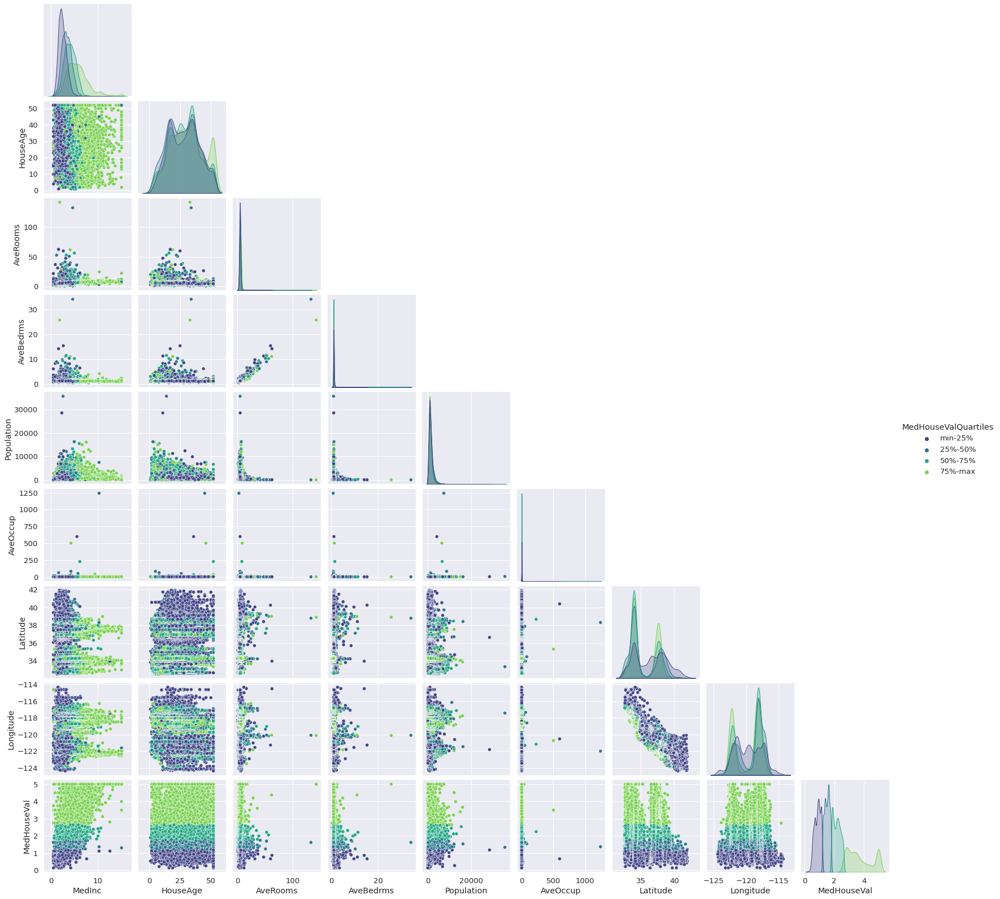

In [12]:
## Creating pairplot of predictive attributes and Median House Value (target) using q.cut into quantiles

bin_labels = ['min-25%', '25%-50%', '50%-75%', '75%-max']

housing_df_pairplots["MedHouseValQuartiles"] = pd.qcut(housing_df_pairplots["MedHouseVal"], q=4, labels=bin_labels)

# Using corner = True will only display the lower triangle. Use for easier viewing as the top triangle is the same info
sns.pairplot(housing_df_pairplots, hue='MedHouseValQuartiles', palette="viridis", corner=True);

### Standardize the data set 

In [13]:
x = housing_df
scaled_array = StandardScaler().fit_transform(x) # This is an array of the standardized values of the original columns
housing_standardized = pd.DataFrame(data= np.c_[scaled_array],\
                                    columns = ('MedInc', 'HouseAge', 'AveRooms', 'AveBedrms','Population',\
                                               'AveOccup','Latitude','Longitude', 'MedHouseVal'))
# View standardized data frame
housing_standardized.head()

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,MedHouseVal
0,2.344766,0.982143,0.628559,-0.153758,-0.974429,-0.049597,1.052548,-1.327835,2.129631
1,2.332238,-0.607019,0.327041,-0.263336,0.861439,-0.092512,1.043185,-1.322844,1.314156
2,1.782699,1.856182,1.155620,-0.049016,-0.820777,-0.025843,1.038503,-1.332827,1.258693
3,0.932968,1.856182,0.156966,-0.049833,-0.766028,-0.050329,1.038503,-1.337818,1.165100
4,-0.012881,1.856182,0.344711,-0.032906,-0.759847,-0.085616,1.038503,-1.337818,1.172900


In [14]:
# Separate features and target into x and y 
## for both unchanged and standardized Dataframes

x_housing = housing_df.drop(columns='MedHouseVal')
y_housing = housing_df['MedHouseVal']
x_housing_scaled = housing_standardized.drop(columns='MedHouseVal')
y_housing_scaled = housing_standardized['MedHouseVal']

### Multiple Linear Regression Model

EVALUATION METRICS
R2:   0.60623
MAE:  0.53116
MSE:  0.52432
RMSE: 0.7241
COEFFICIENTS
Intercept: -36.9419
MedInc: 0.436693
HouseAge: 0.009436
AveRooms: -0.107322
AveBedrms: 0.645066
Population: -4e-06
AveOccup: -0.003787
Latitude: -0.421314
Longitude: -0.434514
Predicted Vs. Actual By Location


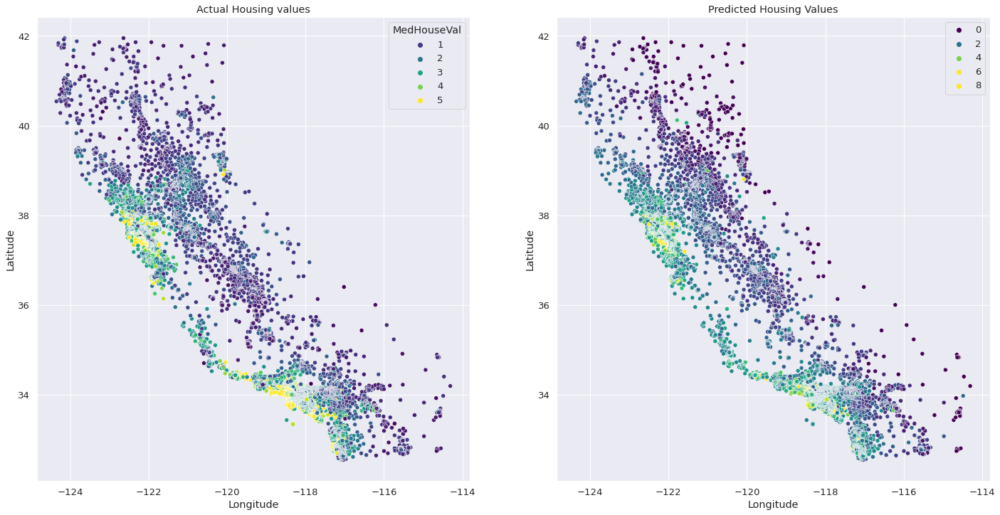

Predicted Vs. Actual Values


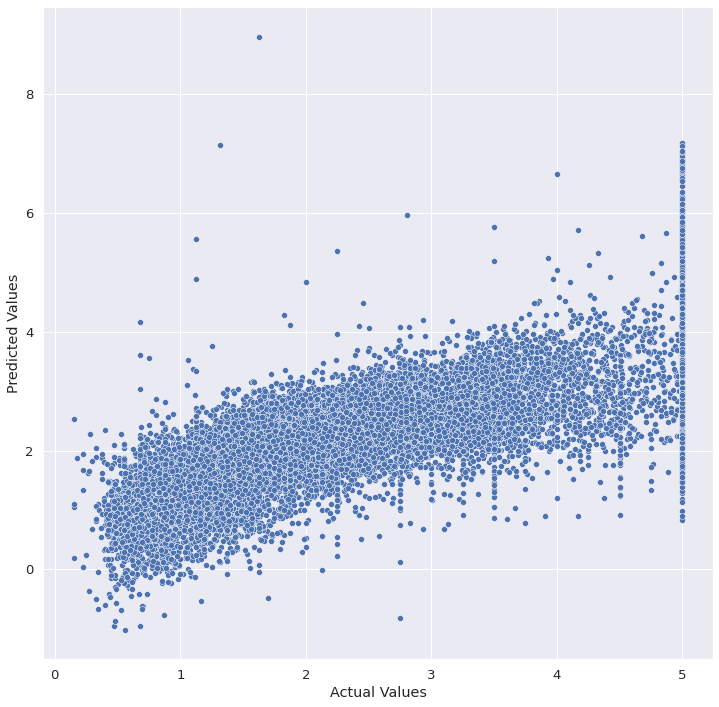

In [15]:
regression(LinearRegression, x_housing, y_housing, 'Linear')

EVALUATION METRICS
R2:   0.60623
MAE:  0.46031
MSE:  0.39377
RMSE: 0.62751
COEFFICIENTS
Intercept: -0.0
MedInc: 0.718952
HouseAge: 0.102911
AveRooms: -0.230107
AveBedrms: 0.264918
Population: -0.003902
AveOccup: -0.03408
Latitude: -0.779845
Longitude: -0.754415
Predicted Vs. Actual By Location


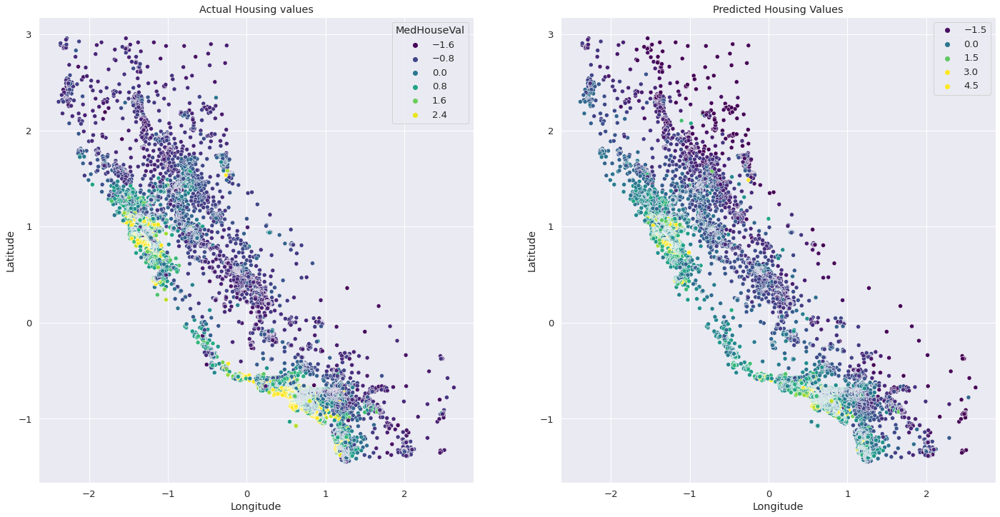

Predicted Vs. Actual Values


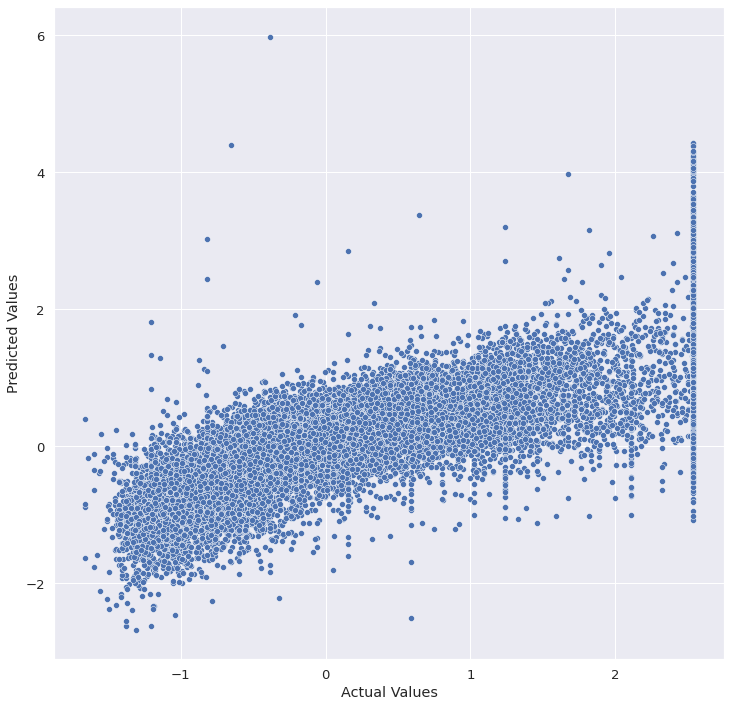

In [16]:
regression(LinearRegression, x_housing_scaled, y_housing_scaled, 'Linear')

### RidgeCV Model

EVALUATION METRICS
R2:   0.60623
MAE:  0.53125
MSE:  0.52432
RMSE: 0.7241
COEFFICIENTS
Intercept: -36.9081
MedInc: 0.435719
HouseAge: 0.009452
AveRooms: -0.105456
AveBedrms: 0.635174
Population: -4e-06
AveOccup: -0.003785
Latitude: -0.421156
Longitude: -0.434217
Predicted Vs. Actual By Location


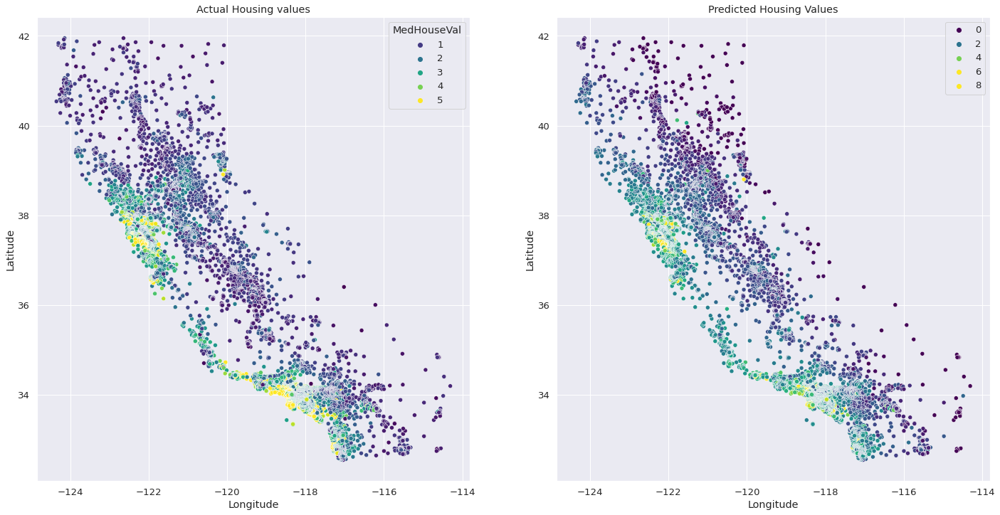

Predicted Vs. Actual Values


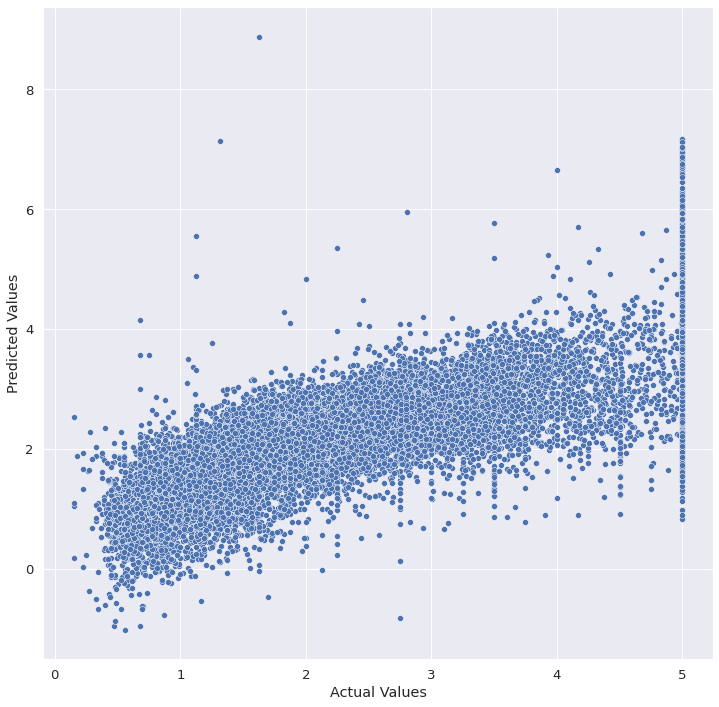

In [17]:
regression(RidgeCV, x_housing, y_housing, 'Linear', alphas=(0.1,1,10))

EVALUATION METRICS
R2:   0.60623
MAE:  0.46028
MSE:  0.39377
RMSE: 0.62751
COEFFICIENTS
Intercept: -0.0
MedInc: 0.718716
HouseAge: 0.103471
AveRooms: -0.228977
AveBedrms: 0.263431
Population: -0.003705
AveOccup: -0.03411
Latitude: -0.774519
Longitude: -0.749038
Predicted Vs. Actual By Location


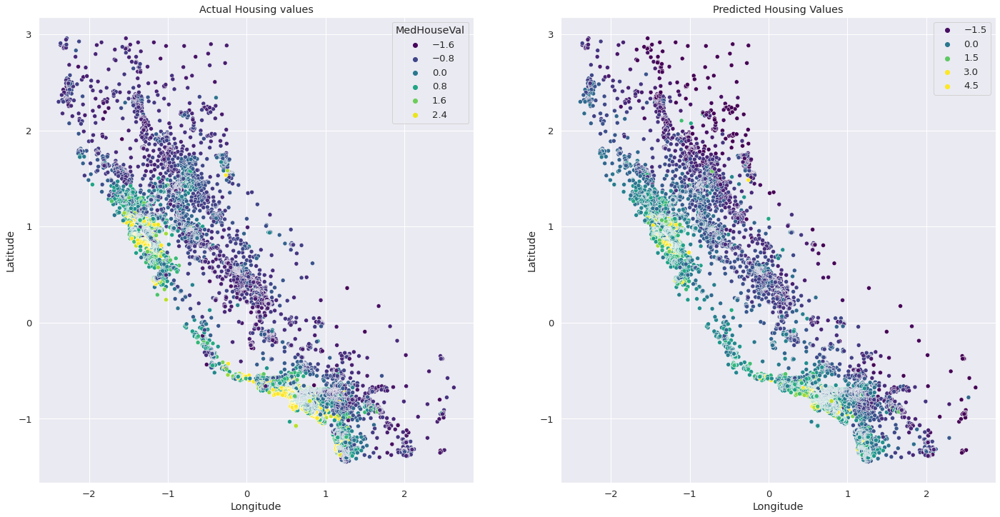

Predicted Vs. Actual Values


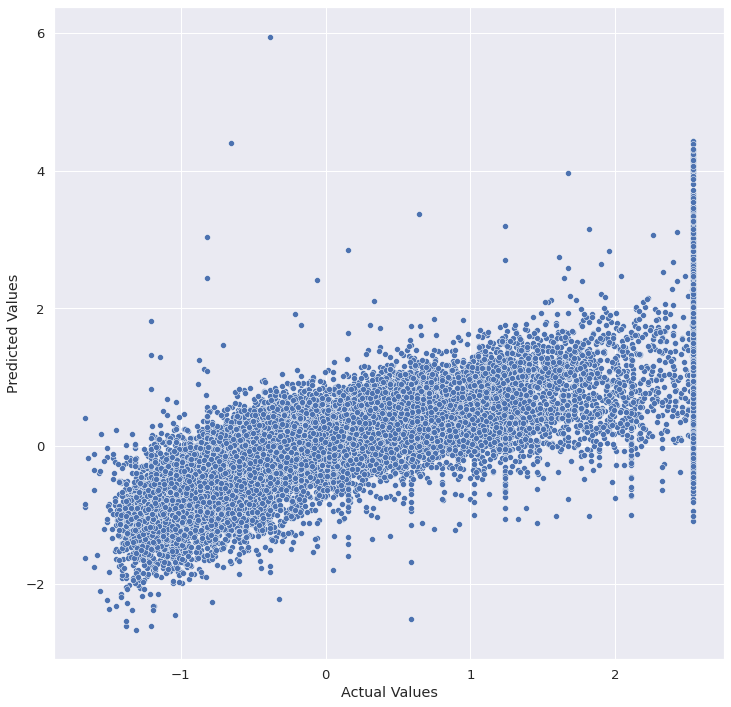

In [18]:
regression(RidgeCV, x_housing_scaled, y_housing_scaled, 'Linear', alphas=(0.1,1,10))

### Lasso Model

EVALUATION METRICS
R2:   0.54527
MAE:  0.58004
MSE:  0.6055
RMSE: 0.77814
COEFFICIENTS
Intercept: -7.6846
MedInc: 0.390583
HouseAge: 0.015082
AveRooms: -0.0
AveBedrms: 0.0
Population: 1.8e-05
AveOccup: -0.003323
Latitude: -0.114214
Longitude: -0.099225
Predicted Vs. Actual By Location


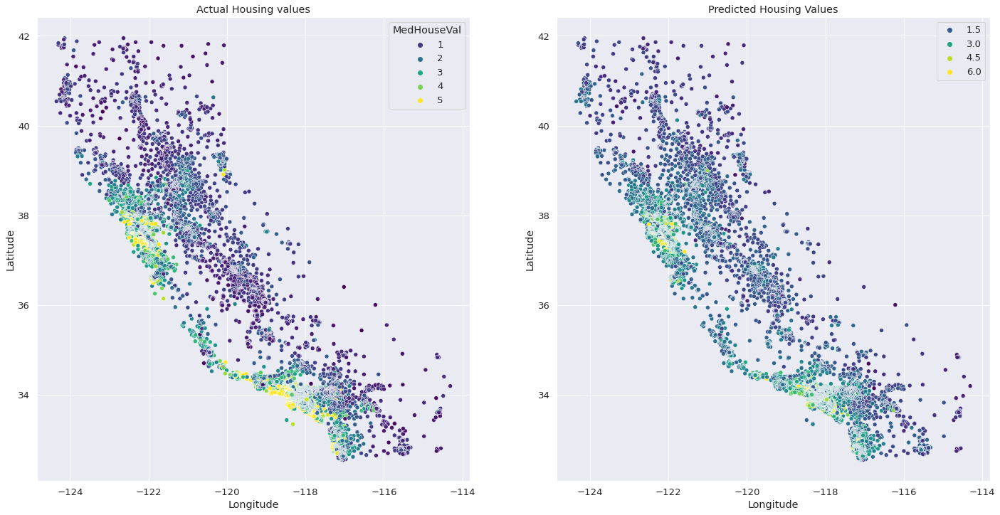

Predicted Vs. Actual Values


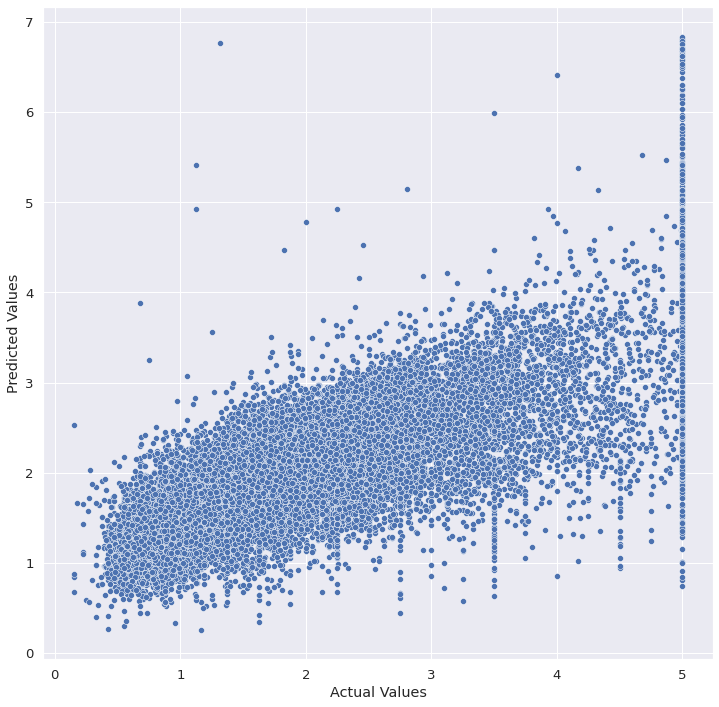

In [19]:
regression(Lasso, x_housing, y_housing, 'Linear', alpha=.1)

EVALUATION METRICS
R2:   0.48642
MAE:  0.54249
MSE:  0.51358
RMSE: 0.71665
COEFFICIENTS
Intercept: 0.0
MedInc: 0.597206
HouseAge: 0.076711
AveRooms: -0.0
AveBedrms: -0.0
Population: -0.0
AveOccup: -0.0
Latitude: -0.0
Longitude: -0.0
Predicted Vs. Actual By Location


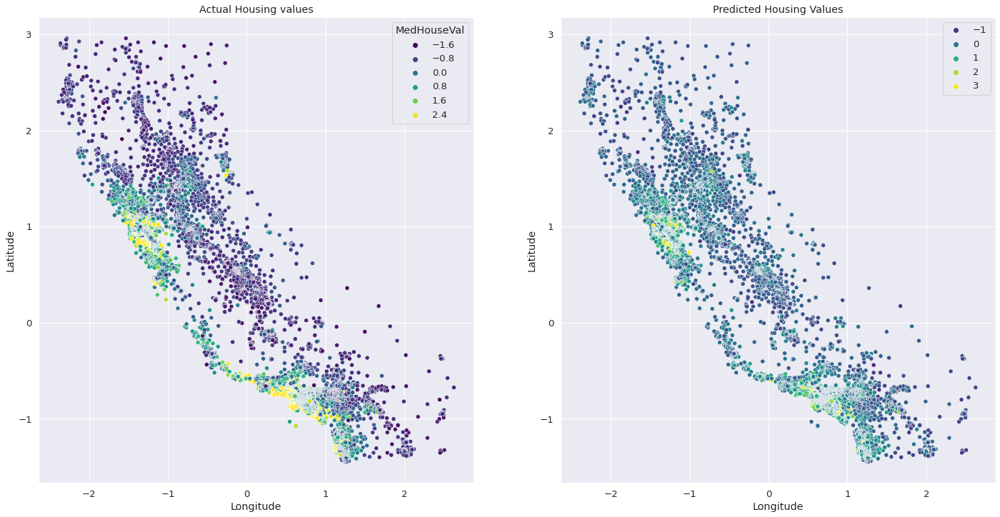

Predicted Vs. Actual Values


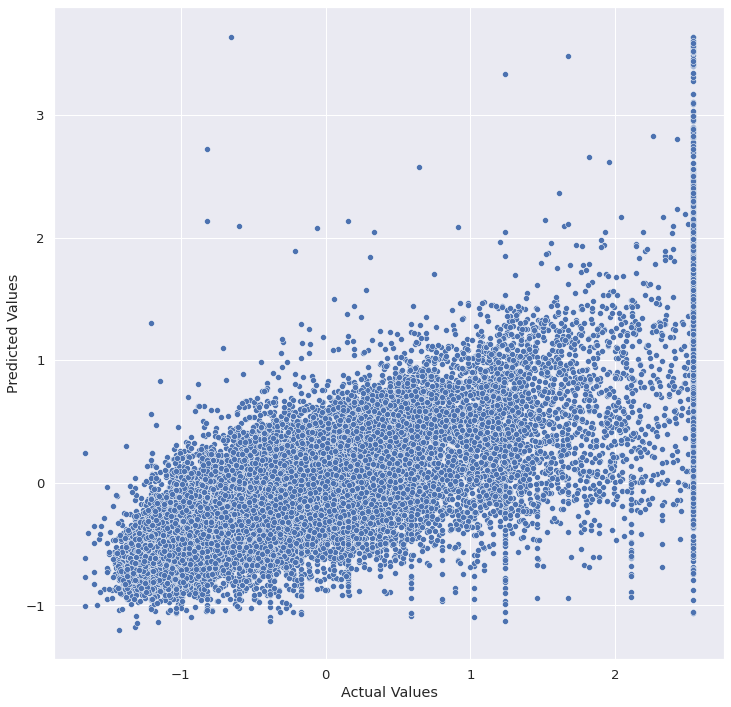

In [20]:
regression(Lasso, x_housing_scaled, y_housing_scaled, 'Linear', alpha=.1)

### Random Forest

EVALUATION METRICS
R2:   0.97401
MAE:  0.11992
MSE:  0.03461
RMSE: 0.18603
Feature Importance Plot


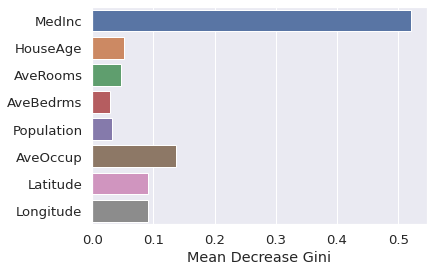

Predicted Vs. Actual By Location


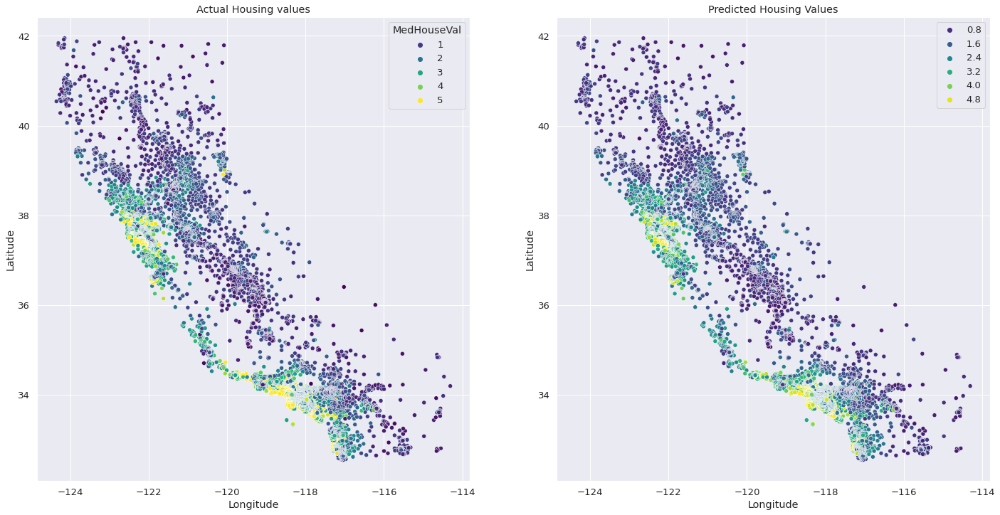

Predicted Vs. Actual Values


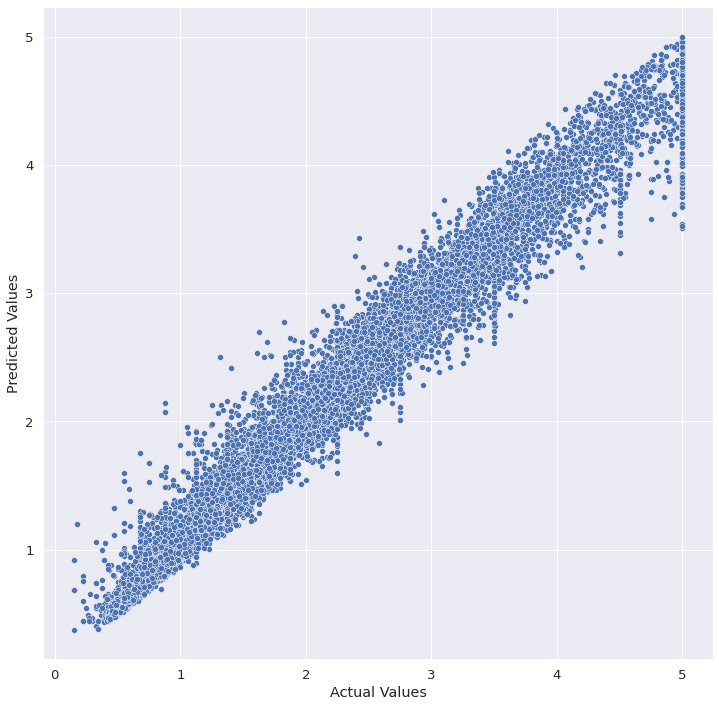

In [21]:
regression(RandomForestRegressor, x_housing, y_housing, 'Tree')

### XGBoost

EVALUATION METRICS
R2:   0.93811
MAE:  0.20223
MSE:  0.08241
RMSE: 0.28708
Feature Importance Plot


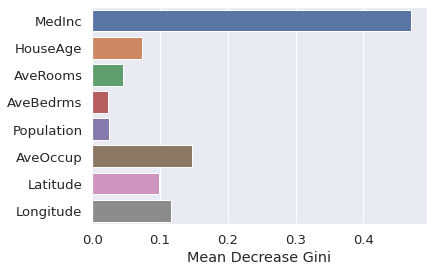

Predicted Vs. Actual By Location


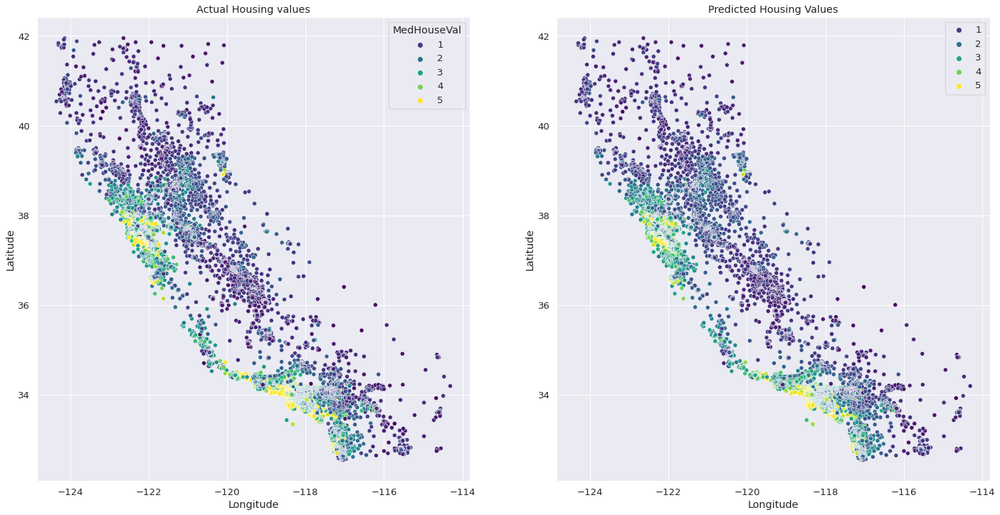

Predicted Vs. Actual Values


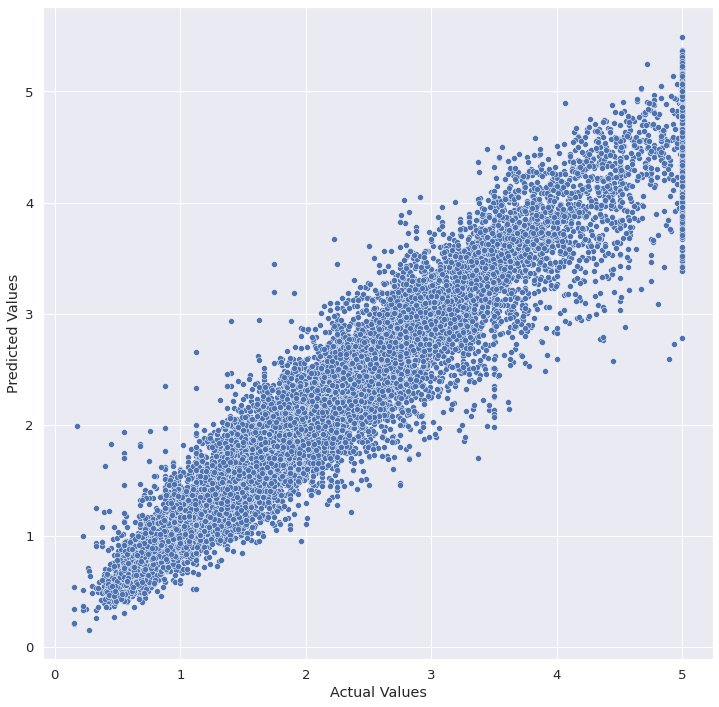

In [22]:
regression(XGBRegressor, x_housing, y_housing, 'Tree')

## Conclusions

Before tuning hyper parameters, the best performing models are Linear Regression and CV Ridge Regression. The feature MedInc seems to have the largest impact on the set. The decision tree based models perform much better than the linear models. 

The linear models tend to miss the high value areas and assign less importance to latitude and longitude, where the more sophisticated decision tree based models do a better job of correctly classifying the high value areas and they seem to be assigning more weight to latitude and longitude in their decisions.

Note that standardizing the data set did not have a significant impact on the linear regression models.  Also, RidgeCV resulted in essentially no change from the Linear Regression model and Lasso performed slightly worse than those two models.  This appears to indicate that regularization of the coefficients did little to reduce the errors.

**R2** - represents the proportion of variance of the dependent variable that has been explained by the independent variables in the model. An R2 of 1 indicates that the regression predictions perfectly fit the data.

**MAE** - arithmetic average of the absolute errors: the average absolute difference between actual and predicted values. Each error contributes to MAE in proportion to the absolute value of the error. 

**MSE**- measures the average of the squares of the errors: the average squared difference between actual and predicted values.

**RMSE** - the square root of MSE.  Because RMSE involves squaring the differences, a few large differences will increase the RMSE to a greater degree than the MAE.

**EVALUATION METRICS**

Measure    | LinReg-Orig| *LinReg-Scaled*|RidgeCV-Orig |*RidgeCV-Scaled*| Lasso-Orig | *Lasso-Scaled*| RandomForest | XGBoost
:-----     | :----      | :-----         | :-----      | :-----         | :-----     | :-----        | :-----       | :-----  
R2         | 0.60623    | *0.60623*      | 0.60623     | *0.60623*      | 0.54527    | *0.48642*     | N/A*         | N/A*
MAE        | 0.53116    | *0.46031*      | 0.53125     | *0.46028*      | 0.58004    | *0.54249*     | 0.11943      | 0.20223
MSE        | 0.52432    | *0.39377*      | 0.52432     | *0.39377*      | 0.60550    | *0.51358*     | 0.03471      | 0.08241
RMSE       | 0.72410    | *0.62751*      | 0.72410     | *0.62751*      | 0.77814    | *0.71665*     | 0.18630      | 0.28708

*While R2 can be calculated for RandomForest and XGBoost, it is not a recommended measure for non-linear models

**COEFFICIENTS**

Measure    | LinReg-Orig| *LinReg-Scaled*|RidgeCV-Orig |*RidgeCV-Scaled*| Lasso-Orig | *Lasso-Scaled*| RandomForest | XGBoost
:-----     | :----      | :-----         | :-----      | :-----         | :-----     | :-----        | :-----       | :-----
Intercept  | -36.941900 |  *-0.000000*   | -36.908100  |  *-0.000000*   |  -7.684600 |   *0.000000*  | N/A          | N/A  
MedInc     |   0.436693 |   *0.718952*   |   0.435719  |   *0.718716*   |   0.390583 |   *0.597206*  | N/A          | N/A  
HouseAge   |   0.009436 |   *0.102911*   |   0.009452  |   *0.103471*   |   0.015082 |   *0.076711*  | N/A          | N/A  
AveRooms   |  -0.107322 |  *-0.230107*   |  -0.105456  |  *-0.228977*   |  -0.000000 |  *-0.000000*  | N/A          | N/A   
AveBedrms  |   0.645066 |   *0.264918*   |   0.635174  |   *0.263431*   |   0.000000 |  *-0.000000*  | N/A          | N/A   
Population |  -0.000004 |  *-0.003902*   |  -0.000004  |  *-0.003705*   |   0.000018 |  *-0.000000*  | N/A          | N/A   
AveOccup   |  -0.003787 |  *-0.034080*   |  -0.003785  |  *-0.034110*   |  -0.003323 |  *-0.000000*  | N/A          | N/A   
Latitude   |  -0.421314 |  *-0.779845*   |  -0.421156  |  *-0.774519*   |  -0.114214 |  *-0.000000*  | N/A          | N/A   
Longitude  |  -0.434514 |  *-0.754415*   |  -0.434217  |  *-0.749038*   |  -0.099225 |  *-0.000000*  | N/A          | N/A   


